# **Sobel Operator**

The computation of derivatives in an image is an important operation to be performed to solve complex tasks. For example, it is used to detect edges verifying where the gradient is higher than its neighbors. OpenCV provides an implementation of the Sobel operator to compute an approximation of the gradient of an image.

*   Horizontal/Vertical changes:

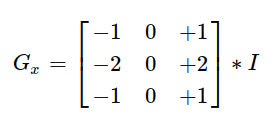 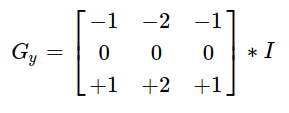

*   Absolute magnitude of the gradient:

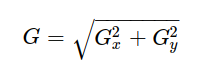 

# **Ex. 1**

In this exercise, you will compute the absolute magnitude of the gradient ($G$) of the gray-scaled 'Lena' image. You can consider the following steps:

*   Import gray-scaled 'Lena' image;
*   Define derivative kernels;
*   Compute $G_x$ and $G_y$;
*   Compute $G = \sqrt{G_x^2 + G_y^2}$.

To check if $G_x$ and $G_y$ are both correct, use the Sobel function provided by OpenCV which implements a derivative filter. Evaluate the difference between the two filtered images (i.e., $G_x - G_x (Sobel)$ and $G_y - G_y (Sobel)$). 

*   dst	=	cv2.Sobel(	src, ddepth, dx, dy[, dst[, ksize[, scale[, delta[, borderType]]]]]	)

Finally, display input image, $G_x$, $G_y$ and $G$ (use cv2.convertScaleAbs() to convert the results to 8-bit). 

G_x (filter2D) - G_x (Sobel): 0.0
G_y (filter2D) - G_y (Sobel): 0.0


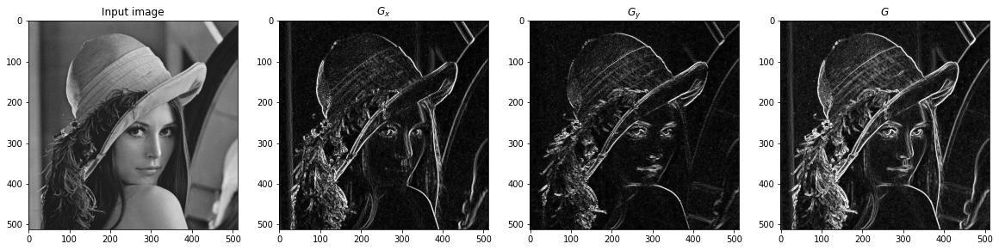

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sklearn.metrics

# Import image
lena = cv2.imread('sift_images/lena.bmp')
# Convert to gray-scale
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
# Define kernels
x_filter = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]) 
y_filter = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]) 
# Compute G_x and G_y
grad_x = cv2.filter2D(lena_gray, cv2.CV_64F, x_filter) 
grad_y = cv2.filter2D(lena_gray, cv2.CV_64F, y_filter)
# Compute G_x and G_y (using Sobel operator)
grad_x_sob = cv2.Sobel(lena_gray, cv2.CV_64F, 1, 0) 
grad_y_sob = cv2.Sobel(lena_gray, cv2.CV_64F, 0, 1) 
# Check differences
diff_x = grad_x - grad_x_sob
diff_y = grad_y - grad_y_sob
print(f"G_x (filter2D) - G_x (Sobel): {diff_x.sum()}") 
print(f"G_y (filter2D) - G_y (Sobel): {diff_y.sum()}") 
# Absolute magnitude
mag = np.sqrt(grad_x**2 + grad_y**2)
# Convert images to 8-bit
grad_x = cv2.convertScaleAbs(grad_x) 
grad_y = cv2.convertScaleAbs(grad_y) 
mag = cv2.convertScaleAbs(mag)
plt.figure(figsize=(20,25))
_ = plt.subplot(1,4,1), plt.imshow(lena_gray, cmap=plt.cm.gray), plt.title('Input image') 
_ = plt.subplot(1,4,2), plt.imshow(grad_x, cmap=plt.cm.gray), plt.title('$G_x$')
_ = plt.subplot(1,4,3), plt.imshow(grad_y, cmap=plt.cm.gray), plt.title('$G_y$')
_ = plt.subplot(1,4,4), plt.imshow(mag, cmap=plt.cm.gray), plt.title('$G$')


# **Laplace operator**

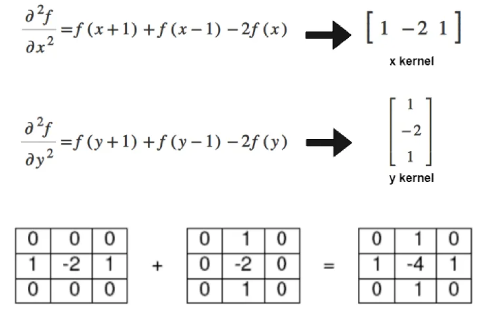

OpenCV provides the function Laplacian() to implement a discrete version of the Laplacian operator.

dst	=	cv.Laplacian(	src, ddepth[, dst[, ksize[, scale[, delta[, borderType]]]]]	)



Difference between my kernel and Opencv implementation: 0


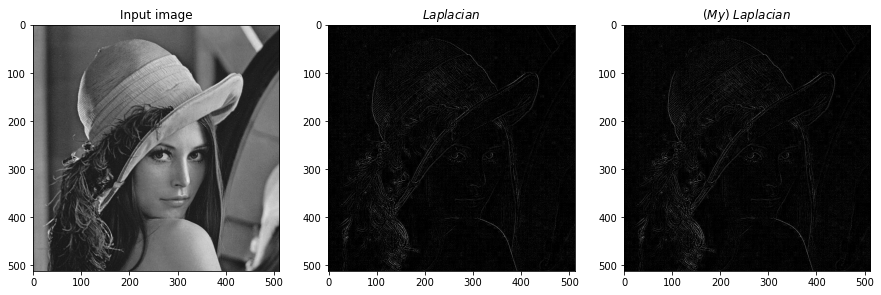

In [2]:
## Apply gaussian filter if input image is noisy
# lena_blur = cv2.GaussianBlur(lena_gray, (3,3), 0)

# Apply Laplace function
laplacian = cv2.Laplacian(lena_gray, -1)

# Define kernel
lap_kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
my_laplacian = cv2.filter2D(lena_gray, -1, lap_kernel)
# Compute difference
laplacian_diff = laplacian - my_laplacian
print(f"Difference between my kernel and Opencv implementation: {laplacian_diff.sum()}")

# Display results
plt.figure(figsize=(15,20))
_ = plt.subplot(1,3,1), plt.imshow(lena_gray, cmap=plt.cm.gray), plt.title('Input image')
_ = plt.subplot(1,3,2), plt.imshow(laplacian, cmap=plt.cm.gray), plt.title('$Laplacian$')
_ = plt.subplot(1,3,3), plt.imshow(my_laplacian, cmap=plt.cm.gray), plt.title('$(My)~Laplacian$')

# **SIFT Algorithm**

SIFT (Scale Invariant Feature Transform) is a widely used feature detection algorithm in computer vision. 

The algorithm can be divided into four parts:

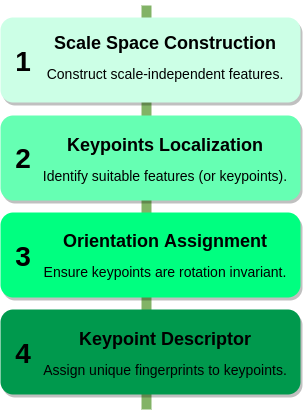

Another popular feature matching algorithm is SURF (Speeded Up Robust Feature), which is simply a faster version of SIFT.


We will use the OpenCV implementation of the SIFT algorithm to detect keypoints and descriptors of an image.

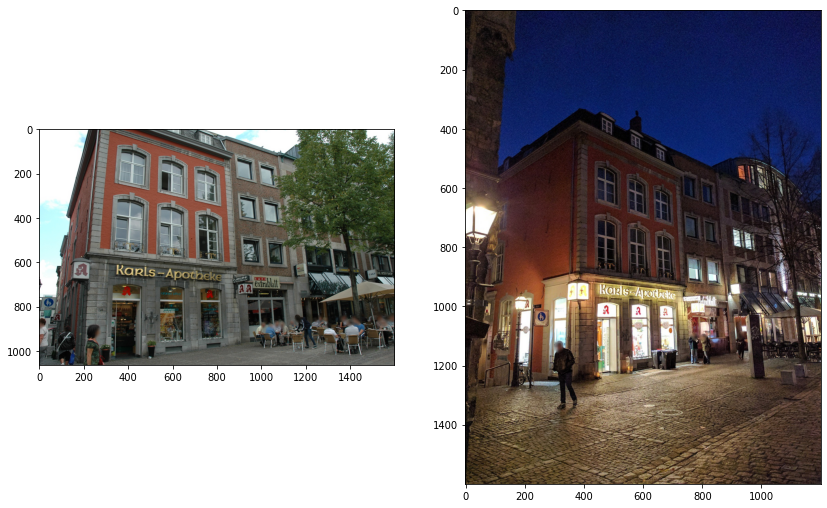

In [3]:
# Read images
aachen_day = cv2.imread("sift_images/Aachen_day.jpg")
aachen_day = cv2.cvtColor(aachen_day, cv2.COLOR_BGR2RGB) 
aachen_night = cv2.imread("sift_images/Aachen_night.jpg")
aachen_night = cv2.cvtColor(aachen_night, cv2.COLOR_BGR2RGB) 

# Display images
fig = plt.figure(figsize=(14,14))
_ = plt.subplot(1,2,1), plt.imshow(aachen_day)
_ = plt.subplot(1,2,2), plt.imshow(aachen_night)

Number of detected keypoints/descriptors: 12979

1st Keypoint Attributes
Class: <class 'cv2.KeyPoint'>
Angle (computed orientation of the keypoint): 0.293914794921875
Pt (coordinates of the keypoint): (2.6426503658294678, 992.6028442382812)
Response (keypoint detector response on the keypoint (that is, strength of the keypoint)): 0.033432409167289734
Size (diameter of the meaningful keypoint neighborhood): 1.974887490272522
Associated descriptor (len: 128):
[  0.   1.   0.   0.   0.   1.   0.   1.  15.  29.  33.   7.   8.   5.
   1.  21.  48.  45.  45.   4.   2.   3.   7.  39.  22.   1.   0.   0.
   0.   4.  80. 134.   0.   0.   0.   0.   4.   3.   0.   0.  23.   9.
  15.  20. 134.  30.   3.   2. 134.  49.  15.   8.  21.   3.   2.  49.
 134.  91.  14.   0.   0.   0.  21. 134.   0.   0.   0.   1.   3.   3.
   0.   0.   9.   1.   9.   8.  70.  87.  32.  15. 134.  44.  27.  10.
   8.  18.  32.  69.  73. 134. 134.   6.   0.   0.   0.   1.   0.   0.
   5.   1.   0.   0.   0.   0.   0.   5. 

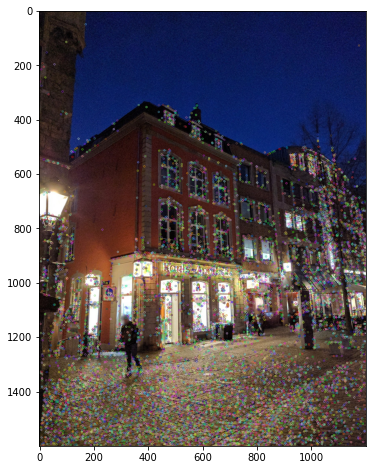

In [4]:
img = aachen_night.copy()

# Define SIFT detector
# retval	=	cv.xfeatures2d.SIFT_create(	[, nfeatures[, nOctaveLayers[, contrastThreshold[, edgeThreshold[, sigma]]]]]	)
sift = cv2.xfeatures2d.SIFT_create()

# Detects keypoints and computes the descriptors
# keypoints, descriptors	=	cv2.Feature2D.detectAndCompute(	image, mask[, descriptors[, useProvidedKeypoints]]	) 
keypoints, descriptors = sift.detectAndCompute(img, None)
# Print number of keypoints
print(f"Number of detected keypoints/descriptors: {len(keypoints)}")

# Select 1st keypoint and show (some of) its attributes
kpt = keypoints[0]
des = descriptors[0]
print(f"\n1st Keypoint Attributes")
print(f"Class: {type(kpt)}")
print(f"Angle (computed orientation of the keypoint): {kpt.angle}")
print(f"Pt (coordinates of the keypoint): {kpt.pt}")
print(f"Response (keypoint detector response on the keypoint (that is, strength of the keypoint)): {kpt.response}")
print(f"Size (diameter of the meaningful keypoint neighborhood): {kpt.size}")
print(f"Associated descriptor (len: {des.size}):\n{des}")  #default for SIFT: 128

# Draw keypoints of the original image
# outImage	=	cv2.drawKeypoints(	image, keypoints, outImage[, color[, flags]]	)
cv2.drawKeypoints(img, keypoints, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG)
                                        #other flag option: cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS   
# Display image with keypoints                        
_ = plt.figure(figsize=(8, 8)), plt.imshow(img)

## **Feature Matching** 

Feature matching (or image matching) is a computer vision task for establishing correspondences between two images representing the same object (or scene). Correspondences between query and database descriptors can be obtained using Brute-Force, k-NN or FLANN-based matchers.

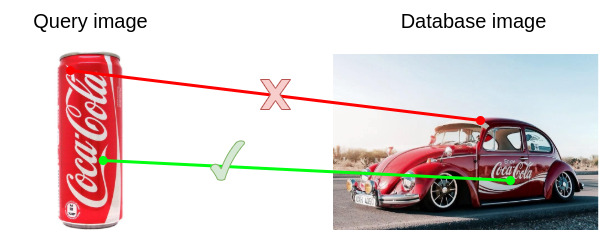

**Brute-Force (BF) Matcher**

*BF Matcher* detects for each descriptor of the query image the closest descriptor (using Euclidean distance or other distance measures) of the database image. In other words, for each descriptor of the query image, it computes the distance between this descriptor and all the descriptors detected in the database image. Then, the closest database descriptors is selected and associated to the query descriptor. Once all the correspondences have been found, we can remove matches whose distance is  greater than a fixed threshold. (Note that this matching procedure can be very slow if the number of detected features is high.)

# **Ex. 2.1** 

Implement the brute-force matching procedure between a query and a database image. 
 

*   Firstly, select a cropped version ([450:1000, 200:900]) of "aachen_day" as query image  and its scaled and rotated version (rotation = 45°, scale = 2.0) as database image.
*   Then, print the number of detected keypoints of both query and database images.
*   Discard all matches above a fixed threshold (e.g., select $thrs = 25$)
*   Finally, print the Euclidean distance of all the matches and the index of the corresponding query and database descriptors. 

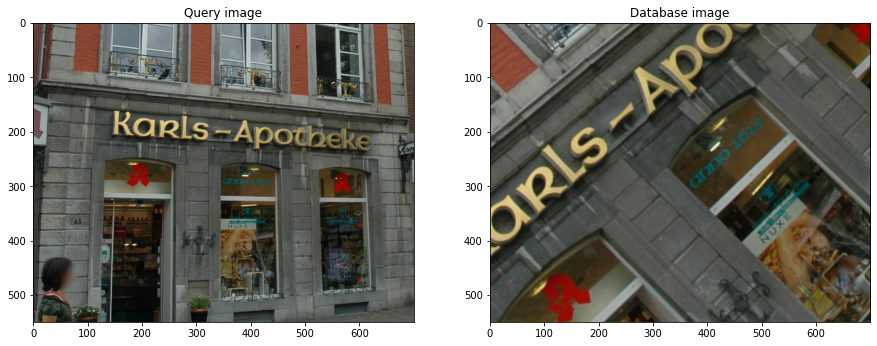


Number of keypoints (query image): 2794.
Number of keypoints (database image): 868.

Number of matches: 17
Euclidean distance: 20.69, Query Descriptor n. 717, Database Descriptor n. 97
Euclidean distance: 21.28, Query Descriptor n. 983, Database Descriptor n. 139
Euclidean distance: 24.29, Query Descriptor n. 1008, Database Descriptor n. 34
Euclidean distance: 19.18, Query Descriptor n. 1037, Database Descriptor n. 49
Euclidean distance: 21.77, Query Descriptor n. 1177, Database Descriptor n. 98
Euclidean distance: 24.15, Query Descriptor n. 1186, Database Descriptor n. 262
Euclidean distance: 19.54, Query Descriptor n. 1261, Database Descriptor n. 311
Euclidean distance: 22.65, Query Descriptor n. 1481, Database Descriptor n. 427
Euclidean distance: 15.87, Query Descriptor n. 1561, Database Descriptor n. 359
Euclidean distance: 15.56, Query Descriptor n. 1562, Database Descriptor n. 360
Euclidean distance: 22.16, Query Descriptor n. 1574, Database Descriptor n. 711
Euclidean distance

In [7]:
# Calculate the center of the image
query_image = aachen_day[450:1000, 200:900] 
(h, w) = query_image.shape[:2]
(cX, cY) = (w//2, h//2)
# Rotate and scale query image
M = cv2.getRotationMatrix2D((cX, cY), 45, 2.0)
db_image = cv2.warpAffine(query_image, M, (w, h))
# Display image
fig = plt.figure(figsize=(15, 20))
_ = plt.subplot(1,2,1), plt.imshow(query_image), plt.title('Query image') 
_ = plt.subplot(1,2,2), plt.imshow(db_image), plt.title('Database image') 
plt.show()
# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None) 
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None) 
print(f"\nNumber of keypoints (query image): {len(query_keypoints)}.") 
print(f"Number of keypoints (database image): {len(db_keypoints)}.\n")
dist_matrix = sklearn.metrics.pairwise_distances(query_descriptors, db_descriptors)
# Find the closest database descriptor to each query descriptor
min_distances = dist_matrix.min(axis = 1) 
db_descriptors_idx = np.argmin(dist_matrix, axis=1)
# Discard matches above the threshold
thrs = 25
query_descriptors_idx = np.where(min_distances <= thrs)[0]
# Select keypoints, descriptors and indices of retrieved matches
query_keypoints = [query_keypoints[idx] for idx in query_descriptors_idx] 
query_descriptors = [query_descriptors[idx] for idx in query_descriptors_idx] 
db_descriptors_idx = [db_descriptors_idx[idx] for idx in query_descriptors_idx] 
db_keypoints = [db_keypoints[idx] for idx in db_descriptors_idx]
db_descriptors = [db_descriptors[idx] for idx in db_descriptors_idx] 
min_distances = [min_distances[idx] for idx in query_descriptors_idx]
print(f"Number of matches: {len(min_distances)}")
# Print Euclidean distance, query descriptor index and database descriptor index of retrieved matches
for k in range(len(min_distances)):
    print(f"Euclidean distance: {min_distances[k]:.2f}, Query Descriptor n. {query_descriptors_idx[k]}, Database Descriptor n. {db_descriptors_idx[k]}")

**Change rotation and scale parameters, or select different image regions as query image, and analyze the impact on the retrieved keypoints, descriptors and matches.**

We can now visualize the keypoints' positions of all the matches.

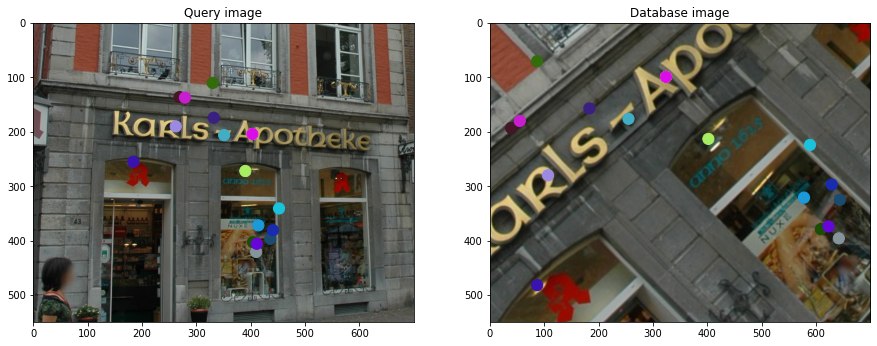

In [8]:
# 2-D keypoints coordinates
#points2f	=	cv.KeyPoint_convert(	keypoints[, keypointIndexes]	)
# This method converts vector of keypoints to vector of points or the reverse
points2f_query	=	cv2.KeyPoint_convert(query_keypoints).astype(int)
points2f_db	=	cv2.KeyPoint_convert(db_keypoints).astype(int)

fig, ax = plt.subplots(1, 2, figsize=(15, 20))
_ = ax[0].imshow(query_image), ax[0].set_title('Query image')
_ = ax[1].imshow(db_image), ax[1].set_title('Database image')

# Random color
c = np.random.rand(len(points2f_query), 3)
_ = ax[0].scatter(points2f_query[:, 0], points2f_query[:, 1], s = 125, color = c, marker='o')
_ = ax[1].scatter(points2f_db[:, 0], points2f_db[:, 1], s = 125, color = c, marker='o')

# **Ex. 2.2 (Optional)**

Evaluate the execution time of retrieving the closest matches between a query and a database image increasing the size of both images. Similarly to the previous exercise, consider as query images cropped versions of "aachen_day" image and their corresponding rotated and scaled versions as database images (rotation = 45°, scale = 2, thrs = 25). Finally, print the execution time of retrieving the closest matches between the query and database images increasing their sizes.  
For example, you can consider the following 5 cropped versions of the "aachen_day" image:

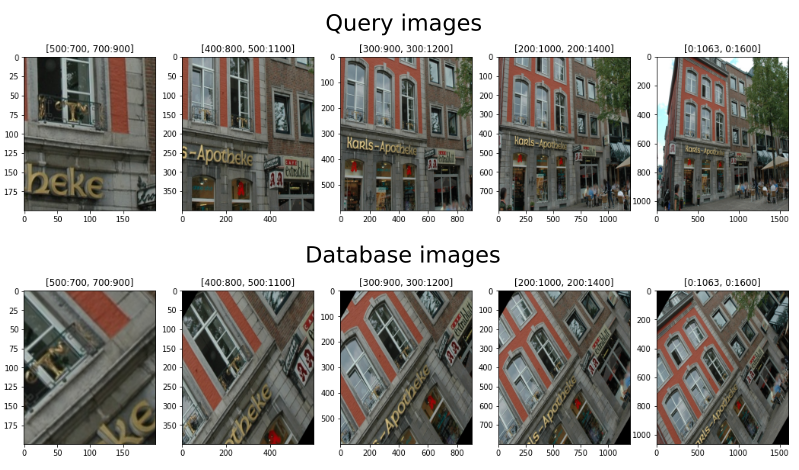


Number of keypoints (query image): 421.
Number of keypoints (database image): 154.


Number of keypoints (query image): 2022.
Number of keypoints (database image): 886.


Number of keypoints (query image): 4304.
Number of keypoints (database image): 1891.


Number of keypoints (query image): 8008.
Number of keypoints (database image): 3210.


Number of keypoints (query image): 13279.
Number of keypoints (database image): 4933.



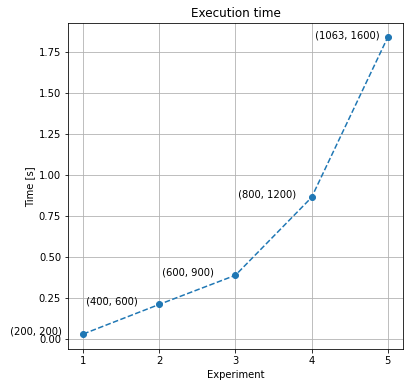

In [11]:
import time

row_min = [500, 400, 300, 200, 0] 
row_max = [700, 800, 900, 1000, 1063] 
col_min = [700, 500, 300, 200, 0] 
col_max = [900, 1100, 1200, 1400, 1600]
# List of execution times
exec_time = []
# List of sizes of cropped images 
images_size = []
# Threshold matches
thrs = 25
for r_min, r_max, c_min, c_max in zip(row_min, row_max, col_min, col_max):
    start_time = time.time()
    # Calculate the center of the image
    query_image = aachen_day[r_min:r_max, c_min:c_max] 
    images_size.append(query_image.shape[:2])
    (h, w) = query_image.shape[:2]
    (cX, cY) = (w//2, h//2)
    # Rotate and scale query image
    M = cv2.getRotationMatrix2D((cX, cY), 45, 2.0) 
    db_image = cv2.warpAffine(query_image, M, (w, h))
    # Detect and compute keypoints and descriptors
    query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None) 
    db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None) 
    print(f"\nNumber of keypoints (query image): {len(query_keypoints)}.") 
    print(f"Number of keypoints (database image): {len(db_keypoints)}.\n")
      # Pairwise distances
    dist_matrix = sklearn.metrics.pairwise_distances(query_descriptors, db_descriptors)
    # Find the closest database descriptor to each query descriptor
    min_distances = dist_matrix.min(axis = 1) 
    db_descriptors_idx = np.argmin(dist_matrix, axis=1)
    # Discard matches above the threshold
    query_descriptors_idx = np.where(min_distances <= thrs)[0]
    # Select keypoints, descriptors and indices of retrieved matches
    query_keypoints = [query_keypoints[idx] for idx in query_descriptors_idx] 
    query_descriptors = [query_descriptors[idx] for idx in query_descriptors_idx] 
    db_descriptors_idx = [db_descriptors_idx[idx] for idx in query_descriptors_idx] 
    db_keypoints = [db_keypoints[idx] for idx in db_descriptors_idx]
    db_descriptors = [db_descriptors[idx] for idx in db_descriptors_idx] 
    min_distances = [min_distances[idx] for idx in query_descriptors_idx]
      # add exection time
    exec_time.append(time.time() - start_time)
_ = plt.figure(figsize=(6,6))
plt.plot(range(1, len(row_min)+1), exec_time, '--o'), plt.title('Execution time'), plt.grid('on') # Integer x-axis
plt.locator_params(axis='x', integer=True, tight=True)
plt.xlabel('Experiment'), plt.ylabel('Time [s]')
for i in range(len(row_min)):
    plt.text(i, exec_time[i], f" ({images_size[i][0]}, {images_size[i][1]})")

> OpenCV provides the BFMatcher_create() function which implements the Brute-Force matcher.

In [12]:
# Calculate the center of the image
query_image = aachen_day[450:1000, 200:900]
(h, w) = query_image.shape[:2]
(cX, cY) = (w//2, h//2)
# Rotate and scale query image
M = cv2.getRotationMatrix2D((cX, cY), 45, 2.0)
db_image = cv2.warpAffine(query_image, M, (w, h))

# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None)

# Brute-force matcher create method. 
# retval	=	cv.BFMatcher_create([, normType[, crossCheck]])
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Finds the best match for each descriptor from a query set.
# matches	=	cv.DescriptorMatcher.match(	queryDescriptors, trainDescriptors[, mask]	)
# It returns a list of DMatch objects with the following attributes:
# DMatch.distance - Distance between descriptors. The lower, the better it is.
# DMatch.trainIdx - Index of the descriptor in train descriptors
# DMatch.queryIdx - Index of the descriptor in query descriptors
# DMatch.imgIdx - Index of the train image.
matches = bf.match(query_descriptors, db_descriptors)

print('DMatch object attributes (matches[0]):')
print(f'DMatch.distance: {matches[0].distance}')
print(f'DMatch.queryIdx: {matches[0].queryIdx}')
print(f'DMatch.trainIdx: {matches[0].trainIdx}')
print(f'DMatch.imgIdx: {matches[0].imgIdx}')

# Discard matches above the threshold
thrs = 25
min_distances = np.asarray([matches[idx].distance for idx in range(len(matches))])
min_query_descriptors_idx = np.where(min_distances <= thrs)[0]
min_db_descriptors_idx = np.asarray([matches[idx].trainIdx for idx in min_query_descriptors_idx])

print(f"\nNumber of matches: {len(min_query_descriptors_idx)}")
# Print Euclidean distance, query descriptor index and database descriptor index of retrieved matches
for idx in range(len(min_query_descriptors_idx)):
  query_idx = min_query_descriptors_idx[idx]
  print(f"Euclidean distance: {min_distances[query_idx]:.2f}, Query Descriptor: n. {query_idx}, Database Descriptor: n.{min_db_descriptors_idx[idx]}")

DMatch object attributes (matches[0]):
DMatch.distance: 378.94195556640625
DMatch.queryIdx: 0
DMatch.trainIdx: 129
DMatch.imgIdx: 0

Number of matches: 17
Euclidean distance: 20.69, Query Descriptor: n. 717, Database Descriptor: n.97
Euclidean distance: 21.28, Query Descriptor: n. 983, Database Descriptor: n.139
Euclidean distance: 24.29, Query Descriptor: n. 1008, Database Descriptor: n.34
Euclidean distance: 19.18, Query Descriptor: n. 1037, Database Descriptor: n.49
Euclidean distance: 21.77, Query Descriptor: n. 1177, Database Descriptor: n.98
Euclidean distance: 24.15, Query Descriptor: n. 1186, Database Descriptor: n.262
Euclidean distance: 19.54, Query Descriptor: n. 1261, Database Descriptor: n.311
Euclidean distance: 22.65, Query Descriptor: n. 1481, Database Descriptor: n.427
Euclidean distance: 15.87, Query Descriptor: n. 1561, Database Descriptor: n.359
Euclidean distance: 15.56, Query Descriptor: n. 1562, Database Descriptor: n.360
Euclidean distance: 22.16, Query Descript

**Compare the above results with the output of the exercise 2.1.**

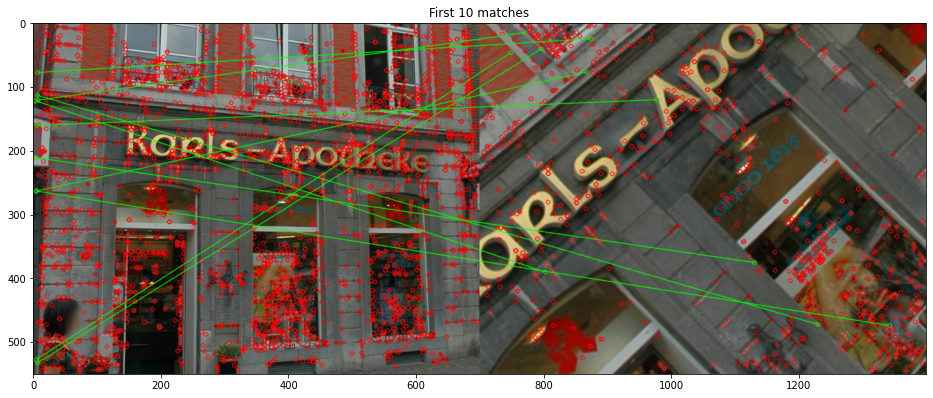

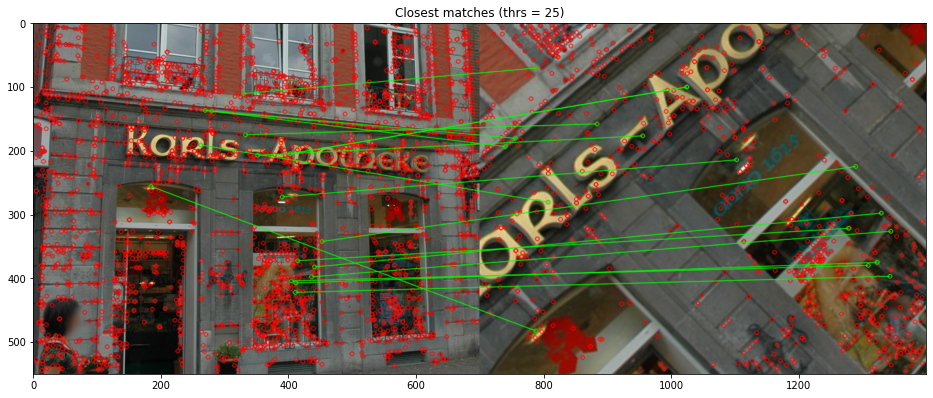

In [13]:
# Plot the first 10 matches
# outImg	=	cv.drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]	)
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)    
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matches[:10], None, **draw_params)

_ = plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')

# Plot the closest matches (distance <= thrs)
# outImg	=	cv.drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]	)
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
closest_matches = [matches[idx] for idx in min_query_descriptors_idx]    
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, closest_matches, None, **draw_params)

_ = plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title(f'Closest matches (thrs = {thrs})')

# **Ex. 3**

> In the next section, you will implement a K-NN matcher to get the K best matches. We set K=2 in order to apply the ratio test as reported by D.Lowe [[Ref]](https://https://www.cs.ubc.ca/~lowe/papers/ijcv04.pdf).

Steps:
*   Select a cropped version ([450:1000, 200:900]) of "aachen_day" as query image  and its scaled and rotated version (rotation = 45°, scale = 2.0) as database image.
*   Apply the SIFT algorithm to detect keypoints and descriptors of both images.
*   For each query descriptor ($des_{q_i}$), you need to find the 2 closest database descriptors ($des_{db_j}$ and $des_{db_k}$). Next, you will apply the ratio test to check if there is a match between $des_{q_i}$ and $des_{db_j}$. If $dist_{ij} = ||(des_{q_i}-des_{db_j})||_2$ and $dist_{ik} = ||(des_{q_i}-des_{db_k})||_2$, you will apply the following ratio test: 

 $dist_{ij} \lt 0.75 * dist_{ik}$. 
 
 If the above condition is satisfied, $des_{q_i}$ is matched to $des_{db_j}$. If the above condition is not satisfied, $des_{q_i}$ cannot be matched to any database descriptors.

* Print the Euclidean distance, query and database descriptors indices of the first 10 retrieved matches.

In [19]:
# Calculate the center of the image
query_image = aachen_day[450:1000, 200:900] 
(h, w) = query_image.shape[:2]
(cX, cY) = (w//2, h//2)
# Rotate and scale query image
M = cv2.getRotationMatrix2D((cX, cY), 45, 2.0) 
db_image = cv2.warpAffine(query_image, M, (w, h))
# Detect and compute keypoints and descriptors
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None) 
db_keypoints, db_descriptors = sift.detectAndCompute(db_image, None)
# Pairwise distances
dist_matrix = sklearn.metrics.pairwise_distances(query_descriptors, db_descriptors)
## K-NN matcher (K=2)
# For each query descriptor find the indices and distances
# of the 2 closest database descriptors.
k=2
distances = np.partition(dist_matrix, kth=k, axis=1)[:, :k]
db_idx = np.argpartition(dist_matrix, kth=k, axis=1)[:, :k]
# Apply ratio test
min_dist = []
min_query_idx = []
min_db_idx = []
for k in range(distances.shape[0]):
    if distances[k][0] < 0.75 * distances[k][1]: 
        min_dist.append(distances[k][0]) 
        min_query_idx.append(k) 
        min_db_idx.append(db_idx[k][0])
print(f"Number of query keypoints: {len(query_keypoints)}") 
print(f"Number of database keypoints: {len(db_keypoints)}") 
print(f"Number of matches: {len(min_dist)}")
# Print first 10 matches
nMatches = 10
for k in range(nMatches):
    print(f"Euclidean distance: {min_dist[k]:.2f}, Query Descriptor: n. {min_query_idx[k]}, Database Descriptor: n.{min_db_idx[k]}")

Number of query keypoints: 2794
Number of database keypoints: 868
Number of matches: 450
Euclidean distance: 69.98, Query Descriptor: n. 20, Database Descriptor: n.87
Euclidean distance: 258.82, Query Descriptor: n. 29, Database Descriptor: n.752
Euclidean distance: 230.82, Query Descriptor: n. 80, Database Descriptor: n.281
Euclidean distance: 80.12, Query Descriptor: n. 85, Database Descriptor: n.723
Euclidean distance: 116.64, Query Descriptor: n. 184, Database Descriptor: n.467
Euclidean distance: 158.81, Query Descriptor: n. 246, Database Descriptor: n.286
Euclidean distance: 207.84, Query Descriptor: n. 282, Database Descriptor: n.467
Euclidean distance: 170.84, Query Descriptor: n. 290, Database Descriptor: n.392
Euclidean distance: 163.71, Query Descriptor: n. 368, Database Descriptor: n.286
Euclidean distance: 133.02, Query Descriptor: n. 464, Database Descriptor: n.91


> OpenCV provides the knnMatch() function which implements the k-NN matcher.

Number of matches: 450
Euclidean distance: 69.98, Query Descriptor: n. 20, Database Descriptor: n.87
Euclidean distance: 258.82, Query Descriptor: n. 29, Database Descriptor: n.752
Euclidean distance: 230.82, Query Descriptor: n. 80, Database Descriptor: n.281
Euclidean distance: 80.12, Query Descriptor: n. 85, Database Descriptor: n.723
Euclidean distance: 116.64, Query Descriptor: n. 184, Database Descriptor: n.467
Euclidean distance: 158.81, Query Descriptor: n. 246, Database Descriptor: n.286
Euclidean distance: 207.84, Query Descriptor: n. 282, Database Descriptor: n.467
Euclidean distance: 170.84, Query Descriptor: n. 290, Database Descriptor: n.392
Euclidean distance: 163.71, Query Descriptor: n. 368, Database Descriptor: n.286
Euclidean distance: 133.02, Query Descriptor: n. 464, Database Descriptor: n.91


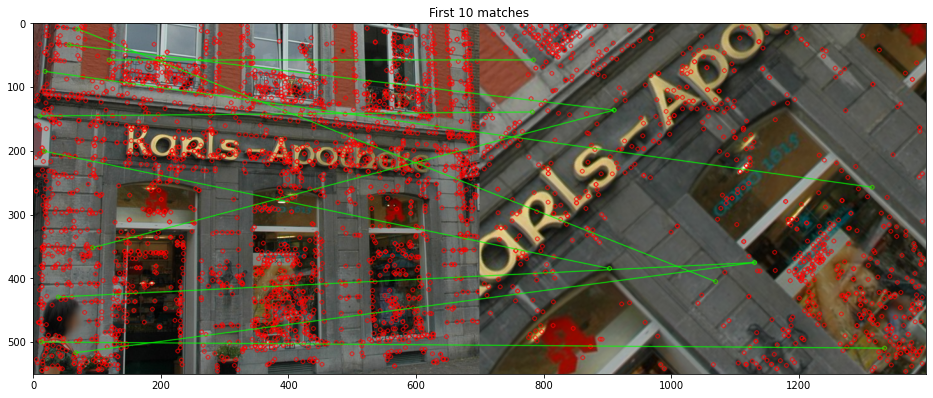

In [20]:
# Create BFMatcher 
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Apply k-NN match
# Finds the k best matches for each descriptor from a query set.
# matches	=	cv.DescriptorMatcher.knnMatch(	queryDescriptors, trainDescriptors, k[, mask[, compactResult]]	)
matches = bf.knnMatch(query_descriptors, db_descriptors, k=2) #  num_query_descriptors -> [2]

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.75 * m_ik.distance:
        matched_des.append(m_ij)

print(f"Number of matches: {len(matched_des)}")

nMatches = 10
for k in range(nMatches):
  print(f"Euclidean distance: {matched_des[k].distance:.2f}, Query Descriptor: n. {matched_des[k].queryIdx}, Database Descriptor: n.{matched_des[k].trainIdx}")
  
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matched_des[:nMatches], None, **draw_params)
_ = plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')

Euclidean distance: 13.86, Query Descriptor: n. 1738, Database Descriptor: n.771
Euclidean distance: 15.56, Query Descriptor: n. 1562, Database Descriptor: n.360
Euclidean distance: 15.87, Query Descriptor: n. 1561, Database Descriptor: n.359
Euclidean distance: 19.18, Query Descriptor: n. 1037, Database Descriptor: n.49
Euclidean distance: 19.54, Query Descriptor: n. 1261, Database Descriptor: n.311
Euclidean distance: 19.82, Query Descriptor: n. 1765, Database Descriptor: n.745
Euclidean distance: 20.69, Query Descriptor: n. 717, Database Descriptor: n.97
Euclidean distance: 20.74, Query Descriptor: n. 1811, Database Descriptor: n.687
Euclidean distance: 21.28, Query Descriptor: n. 983, Database Descriptor: n.139
Euclidean distance: 21.77, Query Descriptor: n. 1177, Database Descriptor: n.98


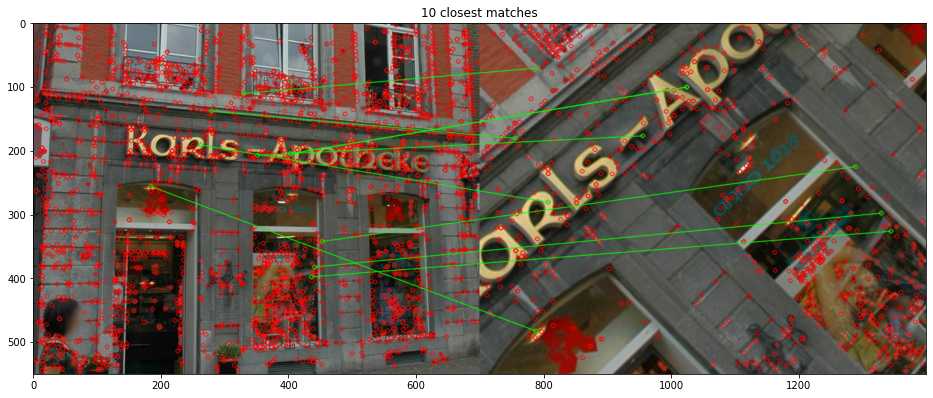

In [21]:
# Get ordered matches
ordered_matches = sorted(matched_des, key = lambda m:m.distance)

for k in range(nMatches):
  print(f"Euclidean distance: {ordered_matches[k].distance:.2f}, Query Descriptor: n. {ordered_matches[k].queryIdx}, Database Descriptor: n.{ordered_matches[k].trainIdx}")

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, ordered_matches[:nMatches], None, **draw_params)
_ = plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('10 closest matches')

# **Ex. 4**

Change the constant parameter (0.75) in the ratio test. How does it affect the matching procedure?

# **FLANN based matcher** (Optional)

Fast Library for Approximate Nearest Neighbors (FLANN) contains a set of  optimized algorithms for fast nearest neighbor search in large datasets and it is faster than the Brute-Force matcher (optimal for large number of keypoints).

Number of matches: 461
Euclidean distance: 214.89, Query Descriptor: n. 8, Database Descriptor: n.247
Euclidean distance: 69.98, Query Descriptor: n. 20, Database Descriptor: n.87
Euclidean distance: 259.45, Query Descriptor: n. 24, Database Descriptor: n.247
Euclidean distance: 258.82, Query Descriptor: n. 29, Database Descriptor: n.752
Euclidean distance: 230.82, Query Descriptor: n. 80, Database Descriptor: n.281
Euclidean distance: 80.12, Query Descriptor: n. 85, Database Descriptor: n.723
Euclidean distance: 116.64, Query Descriptor: n. 184, Database Descriptor: n.467
Euclidean distance: 158.81, Query Descriptor: n. 246, Database Descriptor: n.286
Euclidean distance: 207.84, Query Descriptor: n. 282, Database Descriptor: n.467
Euclidean distance: 170.84, Query Descriptor: n. 290, Database Descriptor: n.392


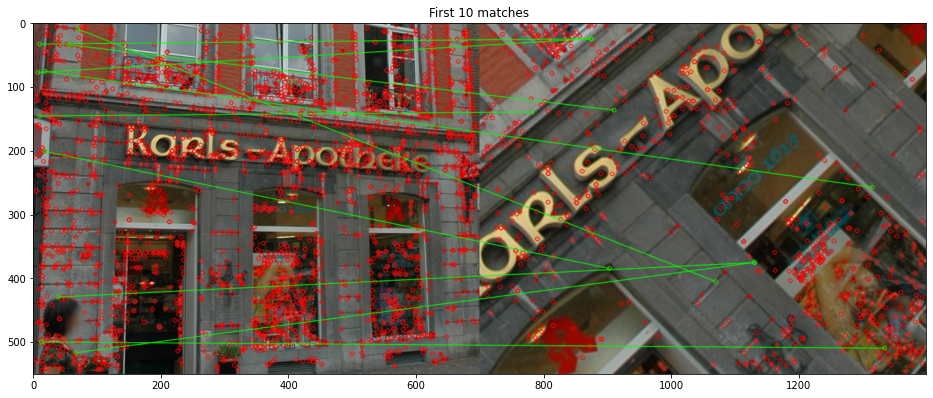

In [22]:
#################################################################################
# We need to pass two dictionaries which specifies 
# the algorithm to be used and other paramters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
# Specify the number of times the trees in the index is recursively traversed
search_params = dict(checks=50)

#	<FlannBasedMatcher object>	=	cv.FlannBasedMatcher(	[, indexParams[, searchParams]]	)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Finds the k best matches for each descriptor from a query set.
matches = flann.knnMatch(query_descriptors, db_descriptors, k=2)
#################################################################################

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.75 * m_ik.distance:
        matched_des.append(m_ij)

print(f"Number of matches: {len(matched_des)}")

nMatches = 10
for k in range(nMatches):
  print(f"Euclidean distance: {matched_des[k].distance:.2f}, Query Descriptor: n. {matched_des[k].queryIdx}, Database Descriptor: n.{matched_des[k].trainIdx}")
  
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, db_image, db_keypoints, matched_des[:nMatches], None, **draw_params)
_ = plt.figure(figsize=(16, 16)), plt.imshow(img_matches), plt.title('First 10 matches')

# **SIFT Application - Panorama stitching**

Given two `images`, we will “stitch” them together to create a simple panorama. Both images need to share some common region. 

The example can also be extended to multiple images.

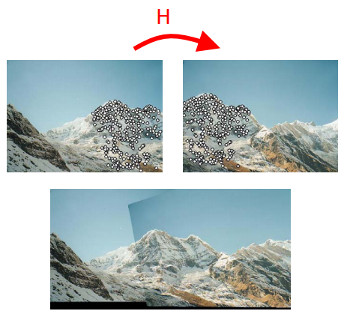

Our panorama stitching algorithm consists of four steps.

**Step 1**: Detect keypoints and extract local invariant descriptors from the two input images.

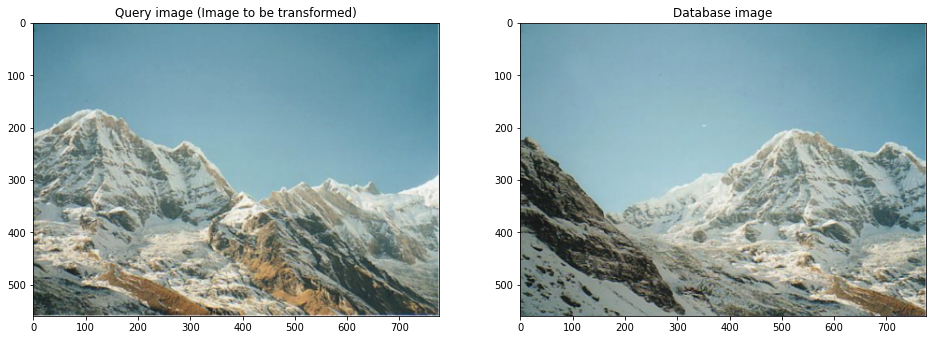

In [23]:
# Load images
database_image = cv2.imread('sift_images/mountain1.png')
database_image = cv2.cvtColor(database_image, cv2.COLOR_BGR2RGB)
query_image = cv2.imread('sift_images/mountain2.png')
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)

_ = plt.figure(figsize=(16,9))
_ = plt.subplot(1,2,1), plt.imshow(query_image), plt.title("Query image (Image to be transformed)")
_ = plt.subplot(1,2,2), plt.imshow(database_image), plt.title("Database image")

In [24]:
# Initialize SIFT object 
sift = cv2.xfeatures2d.SIFT_create()

# Get keypoints and descriptors
# SIFT returns a 128-dimensional feature vector for each key point
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(database_image, None)

print(f"Number of query keypoints: {len(query_keypoints)}")
print(f"Number of database keypoints: {len(db_keypoints)}")

Number of query keypoints: 4623
Number of database keypoints: 4365


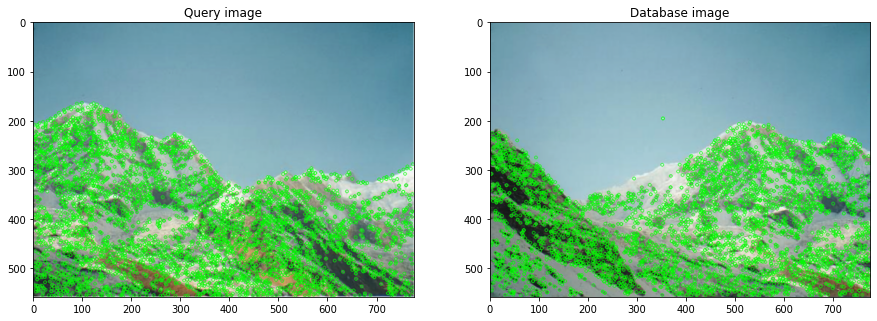

In [25]:
# display the keypoints and features detected on both images
_ = plt.figure(figsize=(15,10))
_ = plt.subplot(1,2,1), plt.imshow(cv2.drawKeypoints(query_image, query_keypoints, None, color=(0,255,0))), plt.title('Query image')
_ = plt.subplot(1,2,2), plt.imshow(cv2.drawKeypoints(database_image, db_keypoints, None, color=(0,255,0))), plt.title('Database image')

**Step 2**: Match the descriptors between the two images.

In [26]:
# Brute-force matcher object
bf = cv2.BFMatcher(cv2.NORM_L2)
# Match descriptors
matches = bf.knnMatch(query_descriptors, db_descriptors, k=2) 

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
    if m_ij.distance < 0.75 * m_ik.distance:
        matched_des.append(m_ij)

print(f"Number of matches: {len(matched_des)}")

Number of matches: 872


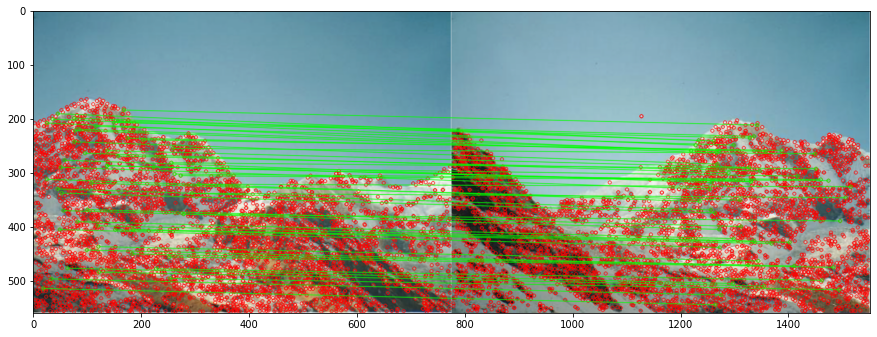

In [27]:
# Draw 50 random matches
sel_matches = np.random.randint(0, len(matched_des)-1, size=50)
matched_des_subset = [matched_des[idx] for idx in sel_matches]

fig = plt.figure(figsize=(15,10))

draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
out_matches = cv2.drawMatches(query_image, query_keypoints, database_image, db_keypoints, matched_des_subset,
                           None, **draw_params)
_ = plt.imshow(out_matches)

# **Ex. 5**
Use a different matching technique and compare the obtained result to the previous matching technique.

Number of matches: 75
Min distance: 64.73793029785156, Max distance: 99.63935089111328.


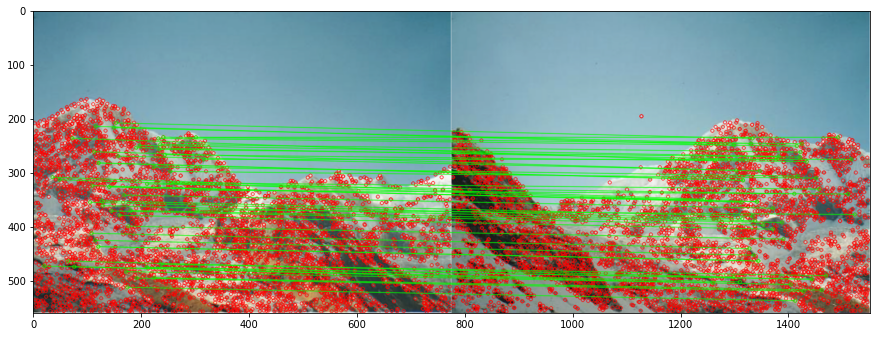

In [28]:
# Brute-force matcher
bf = cv2.BFMatcher_create(cv2.NORM_L2)
# Finds the best match for each descriptor from a query set.
matches = bf.match(query_descriptors, db_descriptors) # Order matches
ordered_matches = sorted(matches, key = lambda m:m.distance) # Discard matches above the threshold
thrs = 100
matched_des = [ordered_matches[idx] for idx in range(len(ordered_matches)) if ordered_matches[idx].distance <= thrs]
print(f"Number of matches: {len(matched_des)}")
print(f"Min distance: {matched_des[0].distance}, Max distance: {matched_des[-1].distance}.")
fig = plt.figure(figsize=(15,10))
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
out_matches = cv2.drawMatches(query_image, query_keypoints, database_image, db_keypoints, matched_des[:50], None, **draw_params)
_ = plt.imshow(out_matches)

**Step 3**: Find linear transformation.

In [29]:
# Location of matches
query_pts = np.zeros((len(matched_des), 2), dtype=np.float32)
db_pts = np.zeros((len(matched_des), 2), dtype=np.float32)

for i, match in enumerate(matched_des):
  query_pts[i, :] = query_keypoints[match.queryIdx].pt
  db_pts[i, :] = db_keypoints[match.trainIdx].pt

# Find homography
H, _ = cv2.findHomography(query_pts, db_pts, cv2.RANSAC)
print(H)

[[ 5.69898707e-01  1.32506513e-01  3.89461047e+02]
 [-2.93299256e-01  8.62559488e-01  8.03753011e+01]
 [-5.20482704e-04 -6.51266773e-05  1.00000000e+00]]


**Step 4**: Apply a warping transformation using the homography matrix obtained from the previous step.

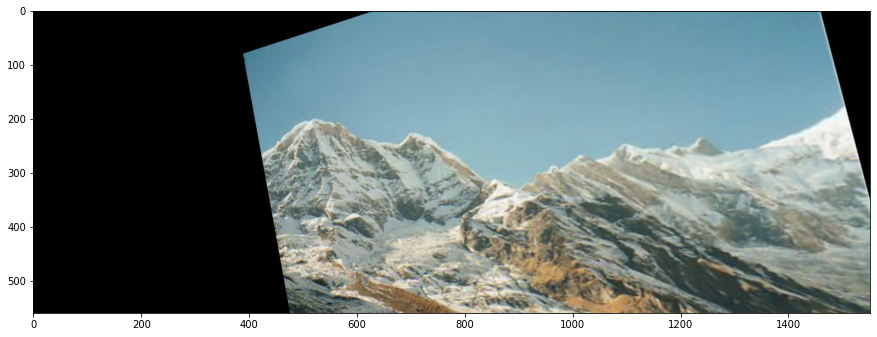

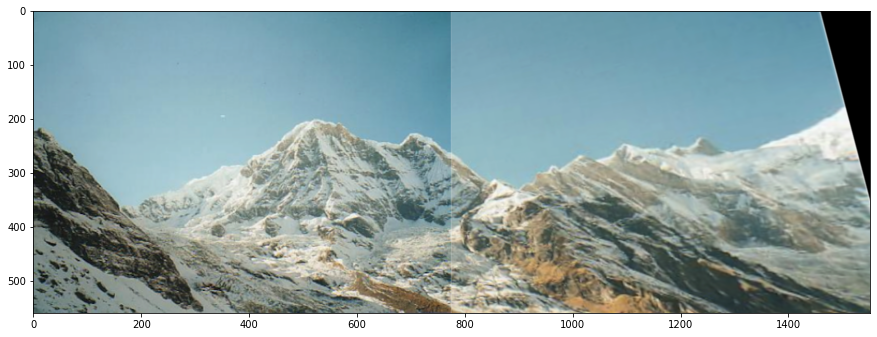

In [30]:
# Size output image
width = query_image.shape[1] + database_image.shape[1]
height = query_image.shape[0] 
# Apply panorama correction
output = cv2.warpPerspective(query_image, H, (width, height))
# Display output
plt.figure(figsize=(15,10))
_ = plt.imshow(output)
output[:database_image.shape[0], :database_image.shape[1], :] = database_image
# Display output
plt.figure(figsize=(15,10))
_ = plt.imshow(output)

# **Feature-based Image Alignment**

In many applications, we have two images of the same object (or scene) that are not aligned. Image alignment (or image registration) is a technique of warping one image so that the features in the two images match. We will consider the following steps:


*   SIFT feature extraction for both query and database images;
*   Feature matching (K-NN + ratio test);
*   Perspective transformation application (cv2.findHomography() + cv2.warpPerspective()) to transform the query image;
*   Plot of the results.

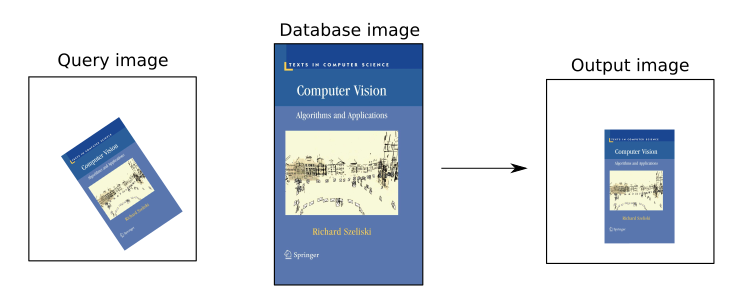

In [31]:
# Read images
query_image = cv2.imread("sift_images/CV_book2.png")
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
database_image = cv2.imread("sift_images/CV_book1.jpg")
database_image = cv2.cvtColor(database_image, cv2.COLOR_BGR2RGB)

# Detect keypoints and descriptors
sift = cv2.xfeatures2d.SIFT_create()
query_keypoints, query_descriptors = sift.detectAndCompute(query_image, None)
db_keypoints, db_descriptors = sift.detectAndCompute(database_image, None)

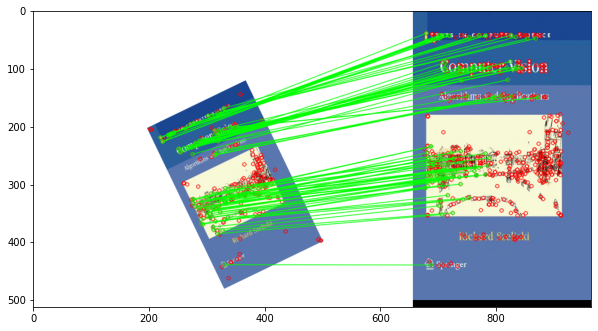

In [32]:
# Create BFMatcher 
bf = cv2.BFMatcher_create(cv2.NORM_L2)

# Apply k-NN match
matches = bf.knnMatch(query_descriptors, db_descriptors, k=2) 

# Apply ratio test
matched_des = []
for m_ij, m_ik in matches:
  if m_ij.distance < 0.75 * m_ik.distance:
    matched_des.append(m_ij)

# Plot matches
nMatches = 100
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
img_matches = cv2.drawMatches(query_image, query_keypoints, database_image, db_keypoints, matched_des[:nMatches], None, **draw_params)
_ = plt.figure(figsize=(10, 10)), plt.imshow(img_matches)

In [33]:
# Location of matches
query_pts = np.zeros((len(matched_des), 2), dtype=np.float32)
db_pts = np.zeros((len(matched_des), 2), dtype=np.float32)

for i, match in enumerate(matched_des):
  query_pts[i, :] = query_keypoints[match.queryIdx].pt
  db_pts[i, :] = db_keypoints[match.trainIdx].pt

In [34]:
# Find homography
H, _ = cv2.findHomography(query_pts, db_pts, cv2.RANSAC)
# Apply transformation
height, width, _ = query_image.shape
img_align = cv2.warpPerspective(query_image, H, (width, height))

Database image size: (500, 308, 3)
Query image size: (512, 657, 3)
Aligned image size: (512, 657, 3)


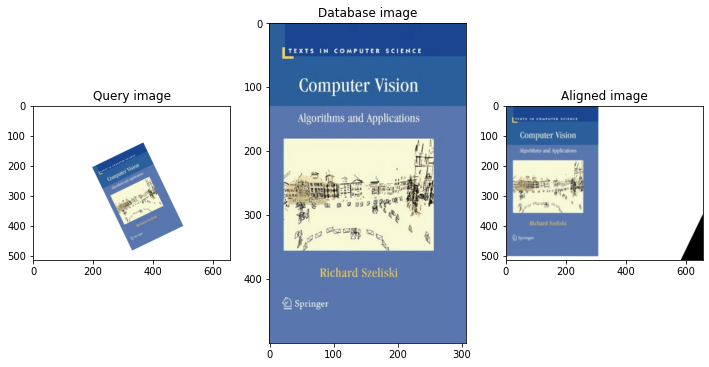

In [35]:
# Display images
print(f"Database image size: {database_image.shape}")
print(f"Query image size: {query_image.shape}")
print(f"Aligned image size: {img_align.shape}")
_ = plt.figure(figsize = (12,12))
_ = plt.subplot(1,3,1), plt.imshow(query_image), plt.title("Query image")
_ = plt.subplot(1,3,2), plt.imshow(database_image), plt.title("Database image")
_ = plt.subplot(1,3,3), plt.imshow(img_align), plt.title("Aligned image")

## Takeaways from the logo-recognition constest
Interesting techniques are:
- Elaborate images before recognition (e.g: scaling, rotating, cropping...)
- Potentially use more query images to give more info about logos from which find matches
- Use homography
- Remove outliers in SIFT (ANSAC)
- Pay attention to avoid overfitting by tailoring too much parameters
- Maybe SIFT is not the best approach
- What happens modifying the metric?
- Can try to change the matching feature step (other modality instead of trivial thresholding)
- 1:1 image comparison every time -> computationally not the best... (Better to generalize the model and extract features to be identified, instead of comparing all images)